# Libraries

In [1]:
import os
import pandas as pd

from src.data_preparation.data_cleaning import DataMissing, DataCharts, DataPreprocess
from src.config import Config

# Check top 45 countries

In [2]:
config = Config()
df = pd.read_csv(config.intermediate_data_file_name)
df

,year,country,population,gdp,primary_energy_consumption,temperature_change_from_co2,total_ghg,cement_co2,coal_co2,consumption_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,other_industry_co2,trade_co2,co2_including_luc
0,1800,Stany Zjednoczone,6000000.0,NaN,NaN,NaN,NaN,0.000,0.253,NaN,0.000,0.000,NaN,0.000,NaN,NaN,NaN
1,1801,Stany Zjednoczone,6113782.0,NaN,NaN,NaN,NaN,0.000,0.267,NaN,0.000,0.000,NaN,0.000,NaN,NaN,NaN
2,1802,Stany Zjednoczone,6229723.0,NaN,NaN,NaN,NaN,0.000,0.289,NaN,0.000,0.000,NaN,0.000,NaN,NaN,NaN
3,1803,Stany Zjednoczone,6347862.0,NaN,NaN,NaN,NaN,0.000,0.297,NaN,0.000,0.000,NaN,0.000,NaN,NaN,NaN
4,1804,Stany Zjednoczone,6468241.0,NaN,NaN,NaN,NaN,0.000,0.333,NaN,0.000,0.000,NaN,0.000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8565,2019,Szwecja,10279122.0,4.670207e+11,625.819,0.003,72.984,1.357,8.115,68.989,0.536,1.780,5.166,28.523,0.522,28.155,45.999
8566,2020,Szwecja,10353680.0,4.568853e+11,600.279,0.003,69.069,1.272,6.649,61.302,0.445,1.442,5.528,26.363,0.532,24.600,42.231
8567,2021,Szwecja,10416136.0,4.814924e+11,633.680,0.003,72.092,1.259,6.992,67.796,0.009,1.901,6.410,27.953,0.519,29.162,45.044
8568,2022,Szwecja,10487333.0,4.942145e+11,621.694,0.003,69.975,1.259,6.914,68.447,0.012,1.550,6.823,25.997,1.742,30.973,44.298


1. Check numerical values. Look for missing values.

In [3]:
data_missing = DataMissing()
data_missing.missing_values(df)

year                            0.000000
country                         0.000000
population                      2.357060
gdp                            36.359393
primary_energy_consumption     70.945158
temperature_change_from_co2     9.159860
total_ghg                       8.634772
cement_co2                     41.750292
coal_co2                       17.946324
consumption_co2                83.453909
flaring_co2                    20.746791
gas_co2                        20.746791
land_use_change_co2             8.634772
oil_co2                        20.746791
other_industry_co2             89.521587
trade_co2                      83.453909
co2_including_luc              23.640607
dtype: float64

2. Charts co2 by year by top 45 countries

In [4]:
year_column = 'year'
entity_column = 'country'

data_charts = DataCharts(year_column, entity_column)
data_preprocess = DataPreprocess(year_column, entity_column)

2a. Check 'co2_including_luc' column

/Users/majarusak/Desktop/Areas/Praca_magisterska/co2_repo/src/data_preparation/data_cleaning.py:122: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


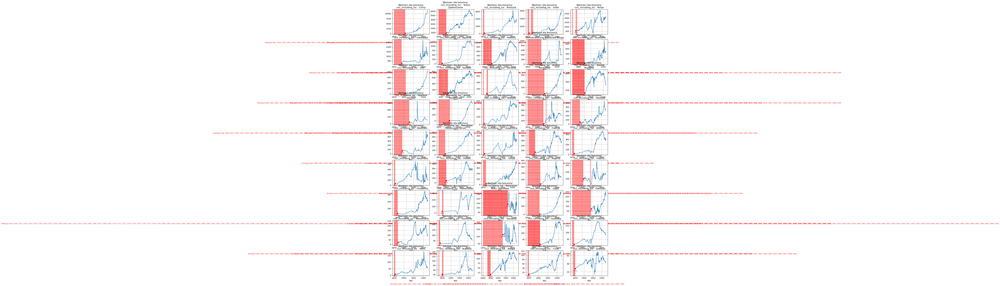

In [5]:
column_co2 = 'co2_including_luc'
data_charts.chart_missing_values(df, column_co2)

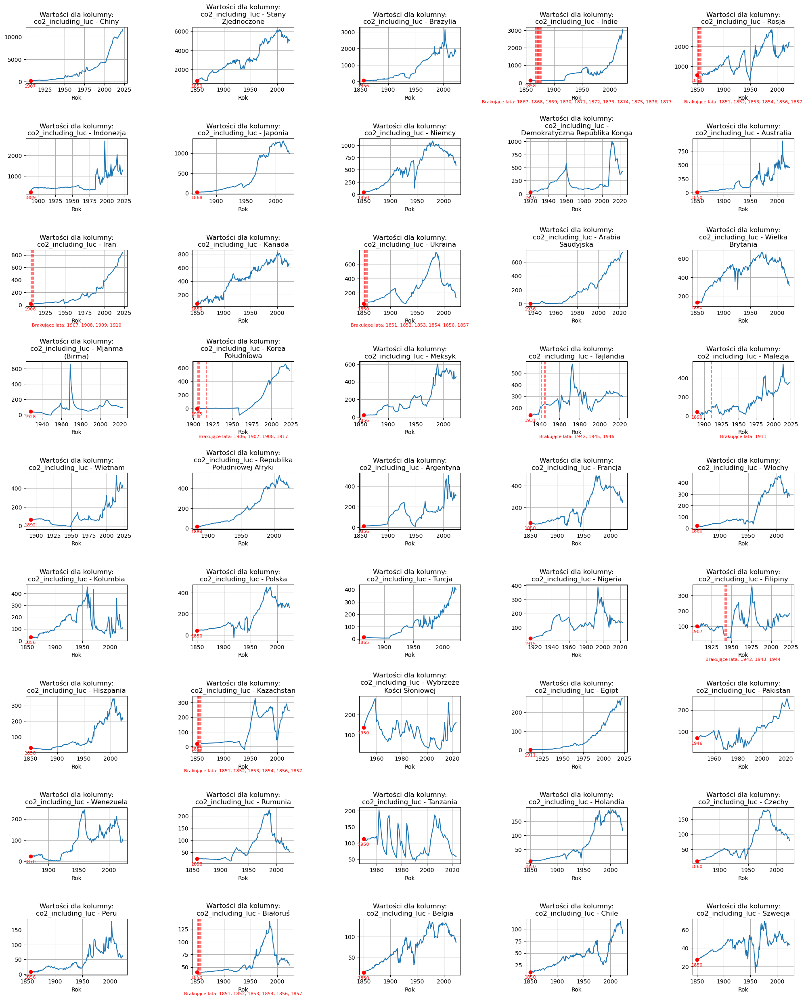

In [6]:
# Process data by removing missing values before the first non-null value
processed1_df_before = data_preprocess.apply_process_country_data(df, column_co2, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed1_df_before, column_co2)

In [7]:
data_missing.missing_values(processed1_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            22.065514
primary_energy_consumption     62.238399
temperature_change_from_co2     0.242645
total_ghg                       0.000000
cement_co2                     29.602669
coal_co2                        0.773430
consumption_co2                78.495602
flaring_co2                     5.156203
gas_co2                         5.156203
land_use_change_co2             0.000000
oil_co2                         5.156203
other_industry_co2             86.381559
trade_co2                      78.495602
co2_including_luc               0.758265
dtype: float64

In [8]:
# Check missing values for each country
data_missing.calculate_missing_values_percentage(processed1_df_before, entity_column, column_co2)

,country,missing_percentage
0,Indie,6.626506
1,Białoruś,3.448276
2,Kazachstan,3.448276
3,Ukraina,3.448276
4,Rosja,3.448276
5,Iran,3.389831
6,Korea Południowa,3.361345
7,Tajlandia,3.225806
8,Filipiny,2.564103
9,Malezja,0.746269


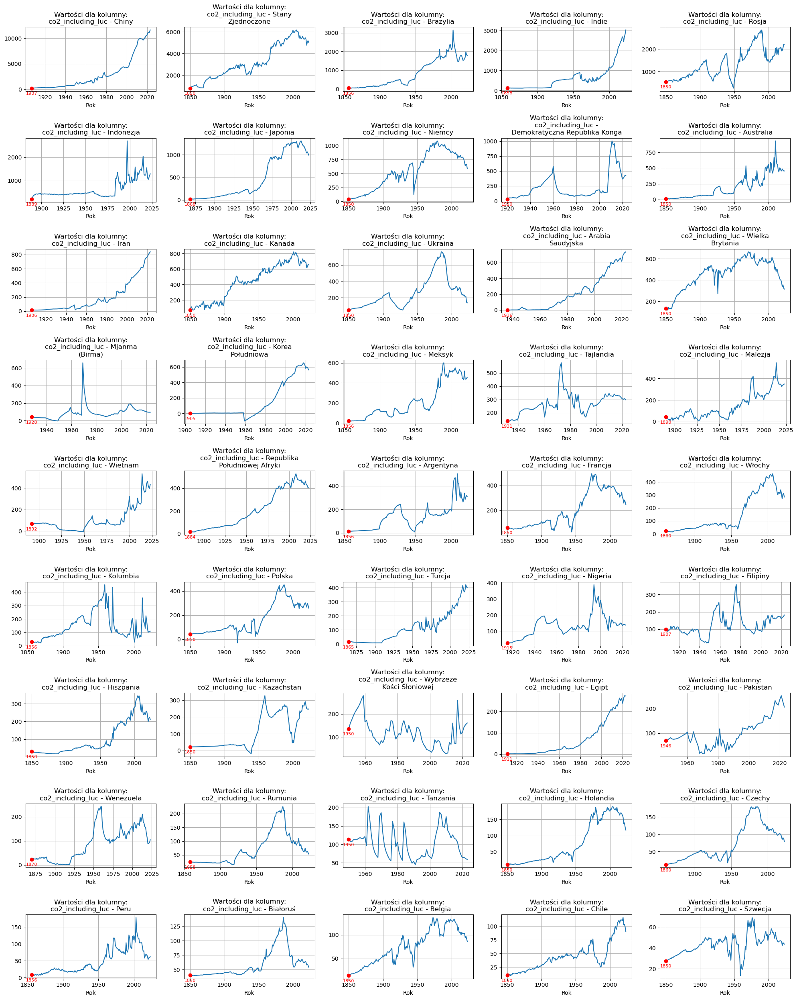

In [9]:
# Process data by filling missing values - max 7% are missing
processed1_df_fill = data_preprocess.apply_process_country_data(processed1_df_before, column_co2, data_preprocess.process_country_data_fill)
data_charts.chart_missing_values(processed1_df_fill, column_co2)

In [10]:
data_missing.missing_values(processed1_df_fill)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            22.065514
primary_energy_consumption     62.238399
temperature_change_from_co2     0.242645
total_ghg                       0.000000
cement_co2                     29.602669
coal_co2                        0.773430
consumption_co2                78.495602
flaring_co2                     5.156203
gas_co2                         5.156203
land_use_change_co2             0.000000
oil_co2                         5.156203
other_industry_co2             86.381559
trade_co2                      78.495602
co2_including_luc               0.000000
dtype: float64

2b. Remove columns with missing values related to co2 ​​greater than 50%

In [11]:
processed2_df = processed1_df_fill.drop(columns={'consumption_co2', 'other_industry_co2', 'trade_co2'})
processed2_df

,year,country,population,gdp,primary_energy_consumption,temperature_change_from_co2,total_ghg,cement_co2,coal_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,co2_including_luc
0,1850,Stany Zjednoczone,23599506.0,8.563832e+10,NaN,NaN,868.699,0.000,19.793,0.000,0.000,797.974,0.000,817.767
1,1851,Stany Zjednoczone,24309683.0,9.221132e+10,NaN,0.000,922.967,0.000,24.633,0.000,0.000,861.796,0.000,886.430
2,1852,Stany Zjednoczone,25040692.0,1.001978e+11,NaN,0.001,969.457,0.000,26.791,0.000,0.000,914.353,0.000,941.144
3,1853,Stany Zjednoczone,25793143.0,1.109706e+11,NaN,0.001,976.582,0.000,30.162,0.000,0.000,925.059,0.000,955.221
4,1854,Stany Zjednoczone,26568199.0,1.143574e+11,NaN,0.002,1012.674,0.000,33.159,0.000,0.000,962.976,0.000,996.135
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6589,2019,Szwecja,10279122.0,4.670207e+11,625.819,0.003,72.984,1.357,8.115,0.536,1.780,5.166,28.523,45.999
6590,2020,Szwecja,10353680.0,4.568853e+11,600.279,0.003,69.069,1.272,6.649,0.445,1.442,5.528,26.363,42.231
6591,2021,Szwecja,10416136.0,4.814924e+11,633.680,0.003,72.092,1.259,6.992,0.009,1.901,6.410,27.953,45.044
6592,2022,Szwecja,10487333.0,4.942145e+11,621.694,0.003,69.975,1.259,6.914,0.012,1.550,6.823,25.997,44.298


In [12]:
data_missing.missing_values(processed2_df)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            22.065514
primary_energy_consumption     62.238399
temperature_change_from_co2     0.242645
total_ghg                       0.000000
cement_co2                     29.602669
coal_co2                        0.773430
flaring_co2                     5.156203
gas_co2                         5.156203
land_use_change_co2             0.000000
oil_co2                         5.156203
co2_including_luc               0.000000
dtype: float64

2c. Check 'coal_co2' column

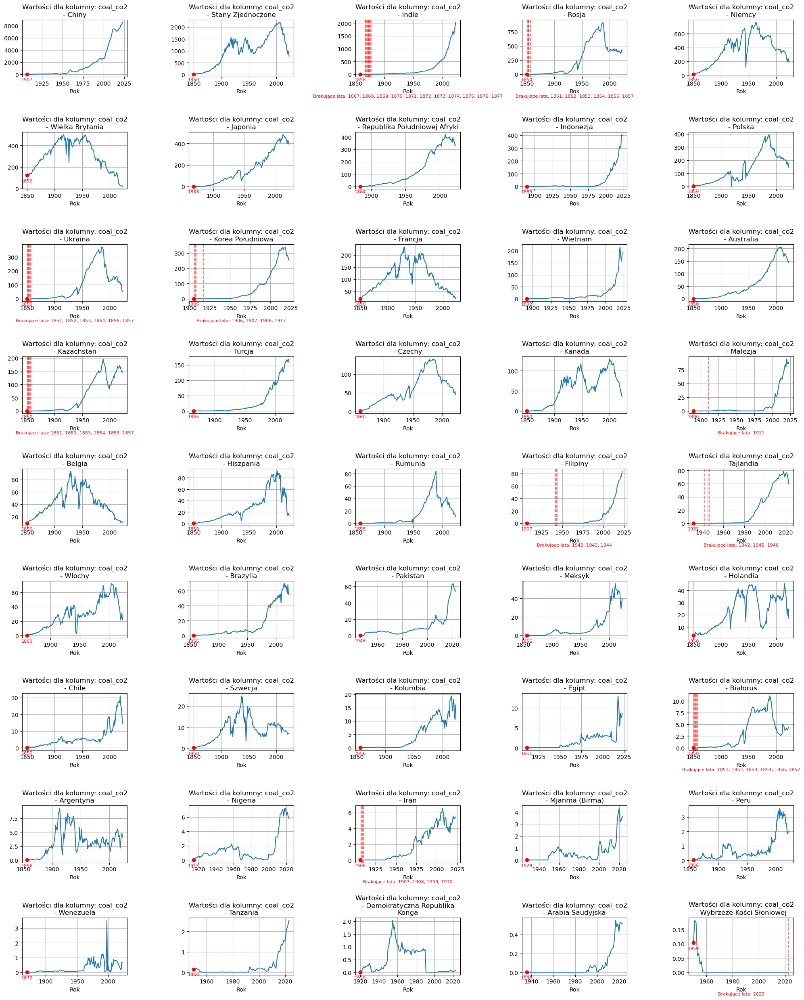

In [13]:
column_coal = 'coal_co2'
data_charts.chart_missing_values(processed2_df, column_coal)

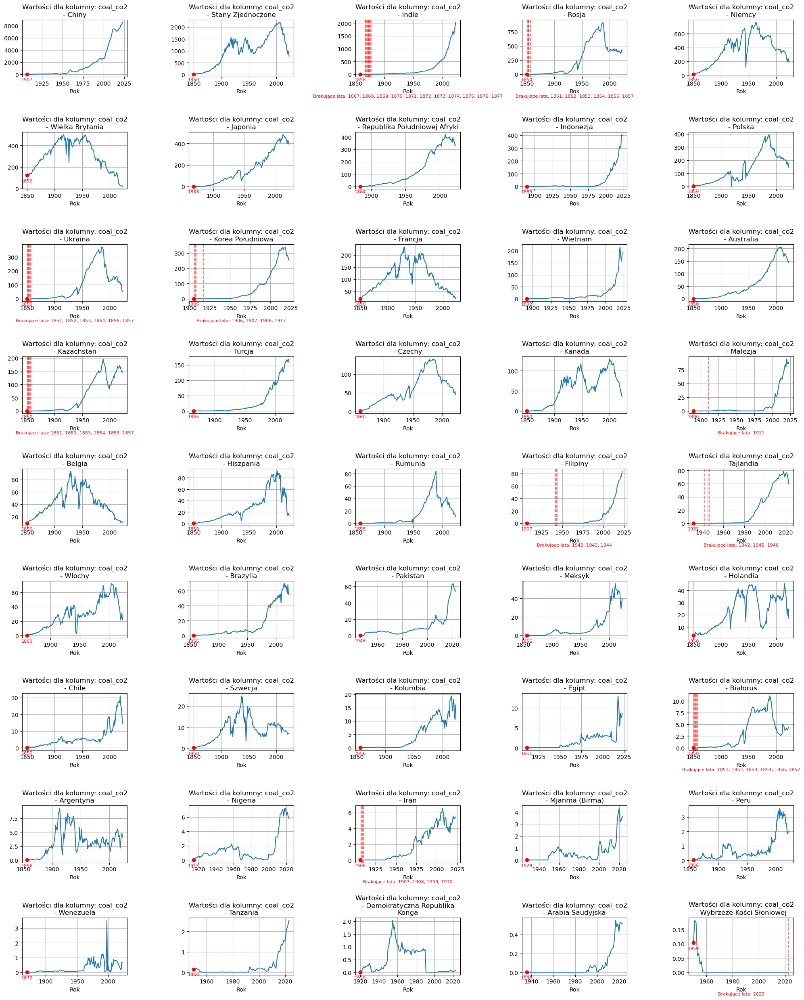

In [14]:
# Process data by removing missing values before the first non-null value
processed3_df_before = data_preprocess.apply_process_country_data(processed2_df, column_coal, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed3_df_before, column_coal)

In [15]:
data_missing.missing_values(processed3_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            22.065514
primary_energy_consumption     62.238399
temperature_change_from_co2     0.242645
total_ghg                       0.000000
cement_co2                     29.602669
coal_co2                        0.773430
flaring_co2                     5.156203
gas_co2                         5.156203
land_use_change_co2             0.000000
oil_co2                         5.156203
co2_including_luc               0.000000
dtype: float64

In [16]:
# Check missing values for each country
data_missing.calculate_missing_values_percentage(processed3_df_before, entity_column, column_coal)

,country,missing_percentage
0,Indie,6.626506
1,Białoruś,3.448276
2,Ukraina,3.448276
3,Kazachstan,3.448276
4,Rosja,3.448276
5,Iran,3.389831
6,Korea Południowa,3.361345
7,Tajlandia,3.225806
8,Filipiny,2.564103
9,Wybrzeże Kości Słoniowej,1.351351


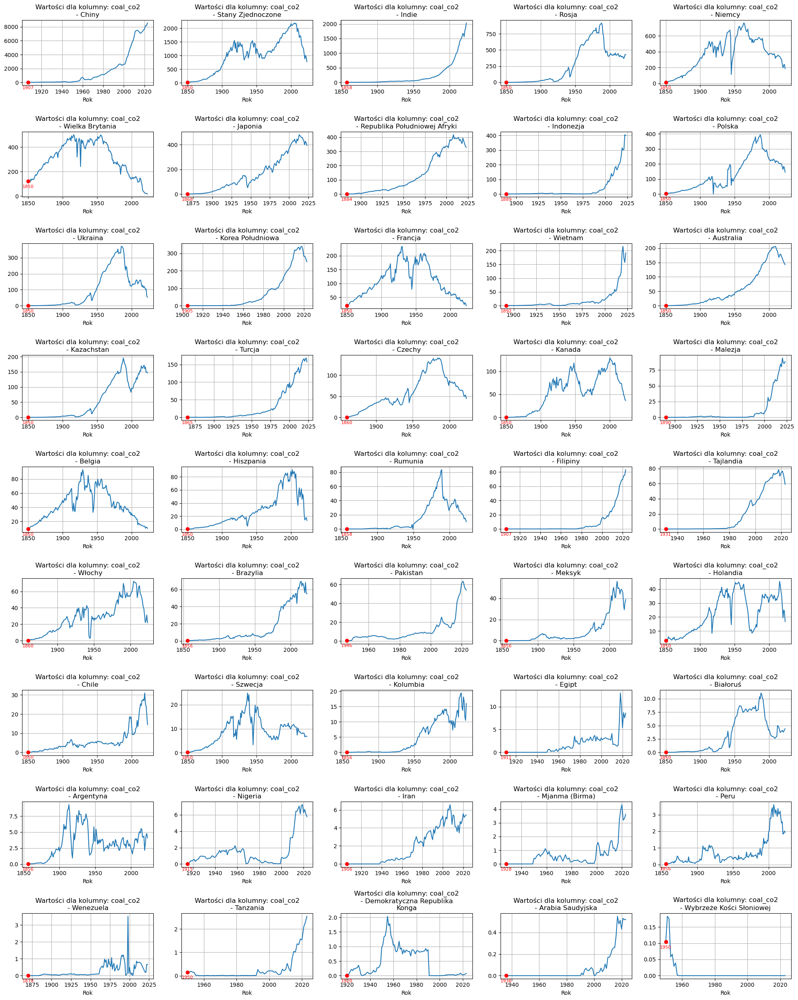

In [17]:
# Process data by filling missing values - max 7% are missing (because this is the same % for coal_co2 I use fill to all of that columns)
processed3_df_fill = data_preprocess.apply_process_country_data(processed3_df_before, column_coal, data_preprocess.process_country_data_fill)
data_charts.chart_missing_values(processed3_df_fill, column_coal)

In [18]:
data_missing.missing_values(processed3_df_fill)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            22.065514
primary_energy_consumption     62.238399
temperature_change_from_co2     0.242645
total_ghg                       0.000000
cement_co2                     29.602669
coal_co2                        0.000000
flaring_co2                     5.156203
gas_co2                         5.156203
land_use_change_co2             0.000000
oil_co2                         5.156203
co2_including_luc               0.000000
dtype: float64

2d. Check 'oil_co2' column

/Users/majarusak/Desktop/Areas/Praca_magisterska/co2_repo/src/data_preparation/data_cleaning.py:122: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


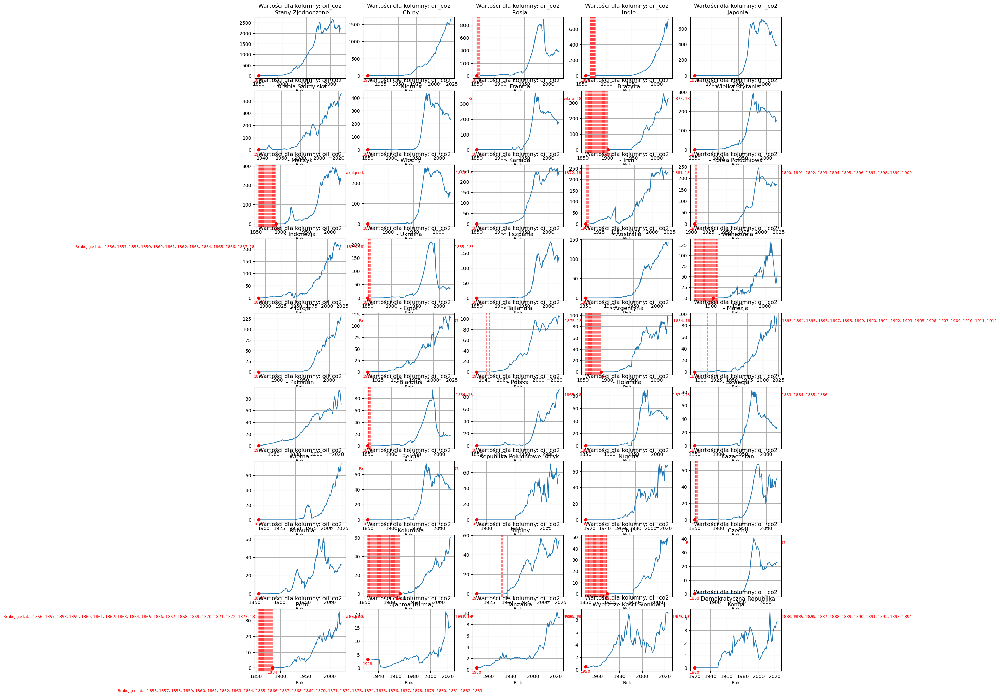

In [19]:
column_oil = 'oil_co2'
data_charts.chart_missing_values(processed3_df_fill, column_oil)

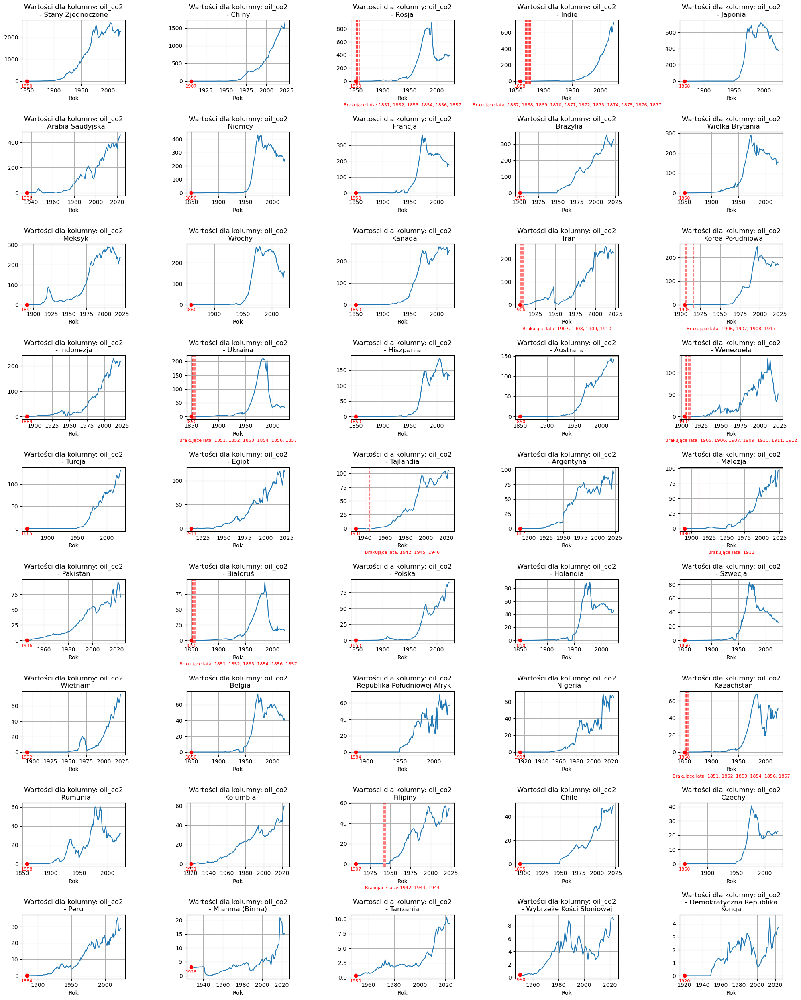

In [20]:
# Process data by removing missing values before the first non-null value
processed4_df_before = data_preprocess.apply_process_country_data(processed3_df_fill, column_oil, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed4_df_before, column_oil)

In [21]:
data_missing.missing_values(processed4_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            20.741562
primary_energy_consumption     60.545080
temperature_change_from_co2     0.237680
total_ghg                       0.000000
cement_co2                     26.445888
coal_co2                        0.000000
flaring_co2                     0.903185
gas_co2                         0.903185
land_use_change_co2             0.000000
oil_co2                         0.903185
co2_including_luc               0.000000
dtype: float64

In [22]:
# Check missing values for each country
data_missing.calculate_missing_values_percentage(processed4_df_before, entity_column, column_oil)

,country,missing_percentage
0,Indie,6.626506
1,Wenezuela,5.833333
2,Białoruś,3.448276
3,Ukraina,3.448276
4,Kazachstan,3.448276
5,Rosja,3.448276
6,Iran,3.389831
7,Korea Południowa,3.361345
8,Tajlandia,3.225806
9,Filipiny,2.564103


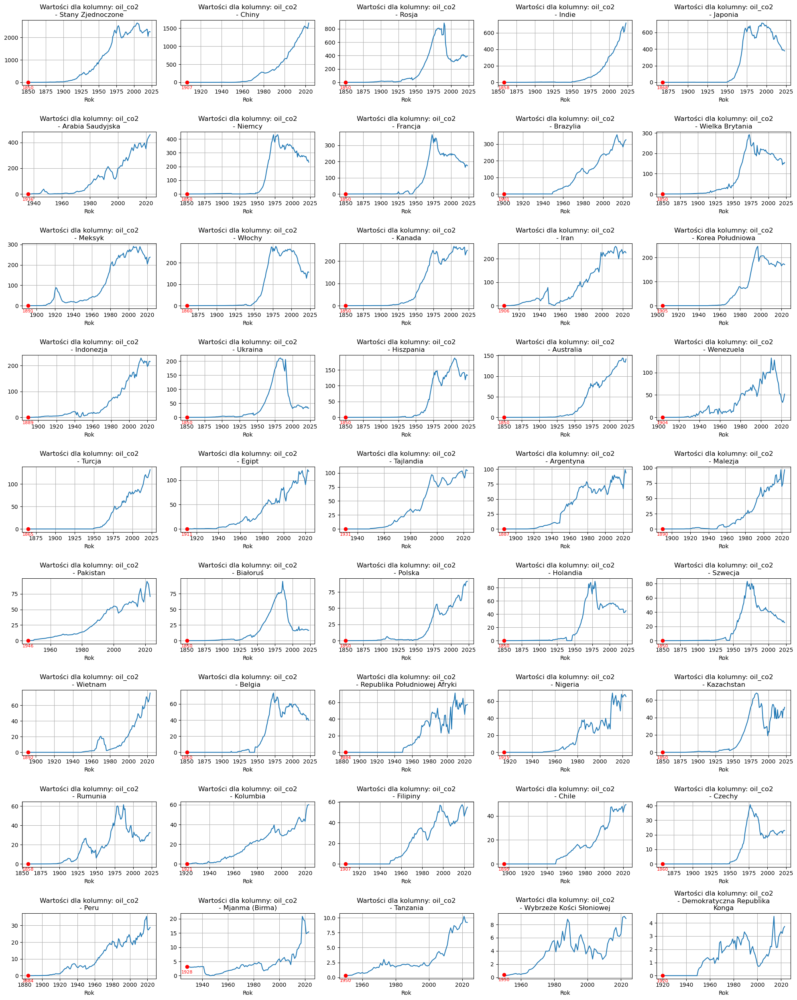

In [23]:
# Process data by filling missing values - max 7% are missing (because this is the same % for oil_co2 I use fill to all of that columns)
processed4_df_fill = data_preprocess.apply_process_country_data(processed4_df_before, column_oil, data_preprocess.process_country_data_fill)
data_charts.chart_missing_values(processed4_df_fill, column_oil)

In [24]:
data_missing.missing_values(processed4_df_fill)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            20.741562
primary_energy_consumption     60.545080
temperature_change_from_co2     0.237680
total_ghg                       0.000000
cement_co2                     26.445888
coal_co2                        0.000000
flaring_co2                     0.903185
gas_co2                         0.903185
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

2e. Check 'gas_co2' column

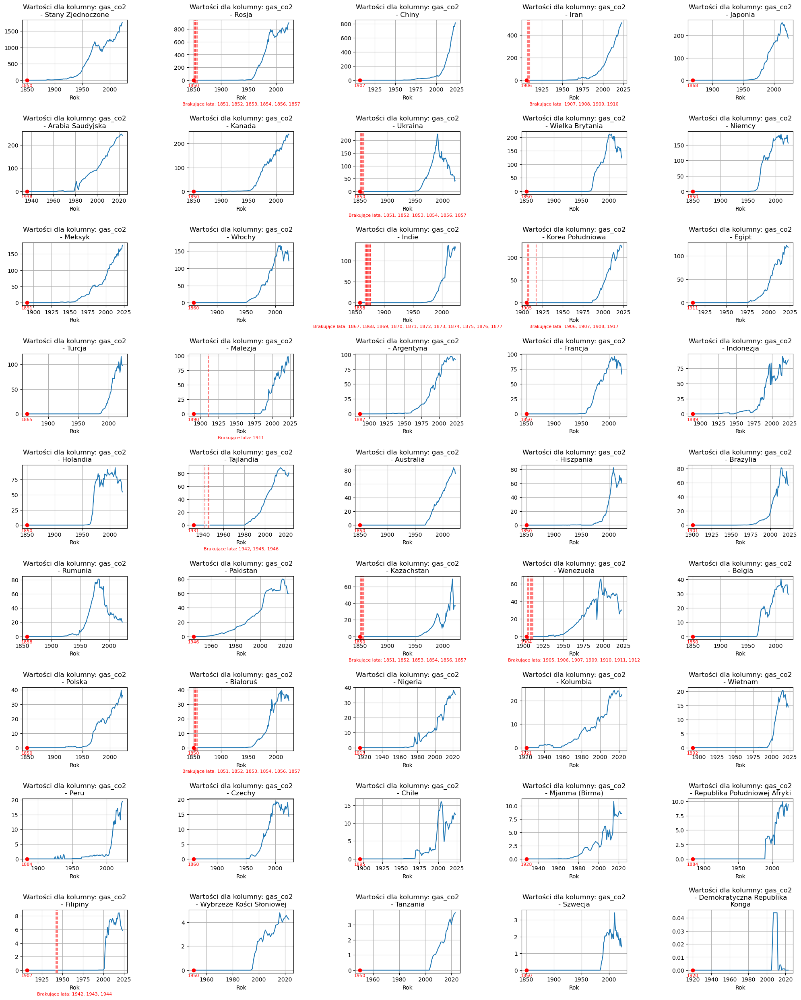

In [25]:
column_gas = 'gas_co2'
data_charts.chart_missing_values(processed4_df_fill, column_gas)

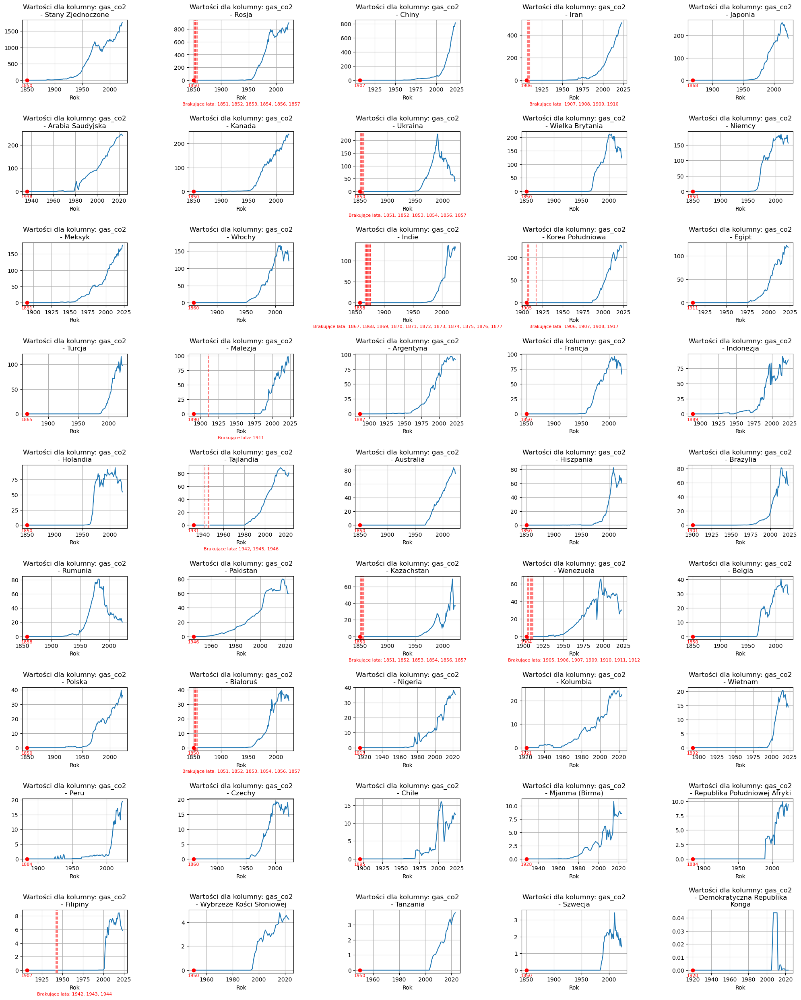

In [26]:
# Process data by removing missing values before the first non-null value
processed5_df_before = data_preprocess.apply_process_country_data(processed4_df_fill, column_gas, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed5_df_before, column_gas)

In [27]:
data_missing.missing_values(processed5_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            20.741562
primary_energy_consumption     60.545080
temperature_change_from_co2     0.237680
total_ghg                       0.000000
cement_co2                     26.445888
coal_co2                        0.000000
flaring_co2                     0.903185
gas_co2                         0.903185
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

In [28]:
# Check missing values for each country
data_missing.calculate_missing_values_percentage(processed5_df_before, entity_column, column_gas)

,country,missing_percentage
0,Indie,6.626506
1,Wenezuela,5.833333
2,Białoruś,3.448276
3,Ukraina,3.448276
4,Kazachstan,3.448276
5,Rosja,3.448276
6,Iran,3.389831
7,Korea Południowa,3.361345
8,Tajlandia,3.225806
9,Filipiny,2.564103


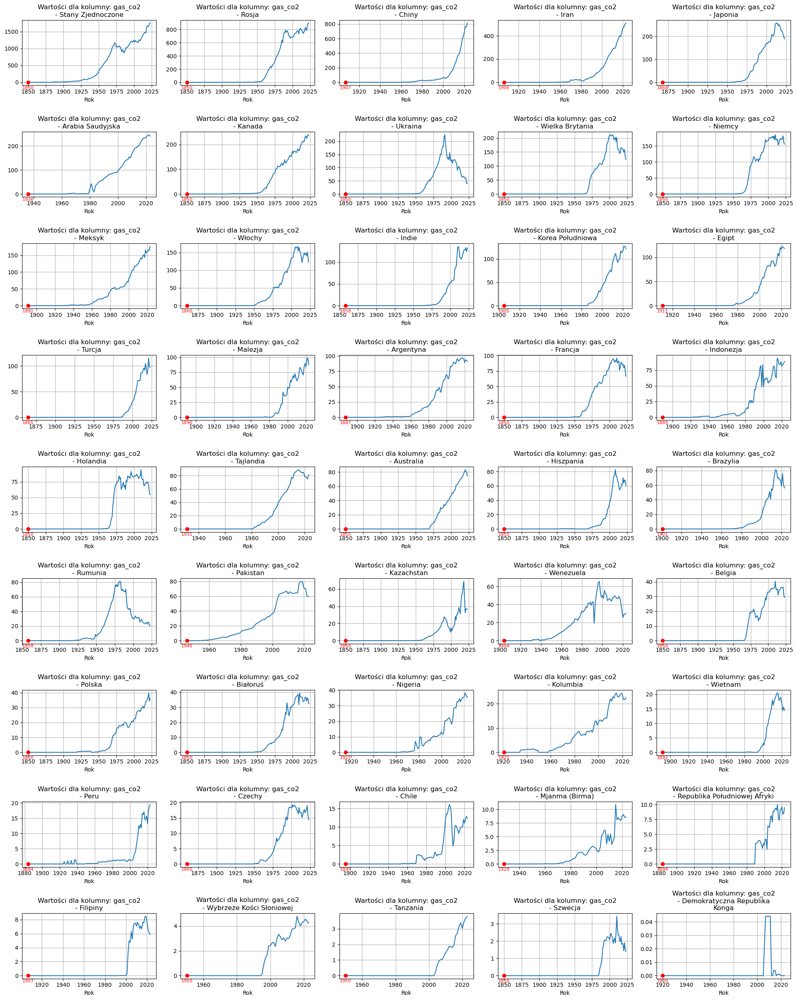

In [29]:
# Process data by filling missing values - max 7% are missing (because this is the same % for gas_co2 I use fill to all of that columns)
processed5_df_fill = data_preprocess.apply_process_country_data(processed5_df_before, column_gas, data_preprocess.process_country_data_fill)
data_charts.chart_missing_values(processed5_df_fill, column_gas)

In [30]:
data_missing.missing_values(processed5_df_fill)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            20.741562
primary_energy_consumption     60.545080
temperature_change_from_co2     0.237680
total_ghg                       0.000000
cement_co2                     26.445888
coal_co2                        0.000000
flaring_co2                     0.903185
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

2f. Check 'flaring_co2'

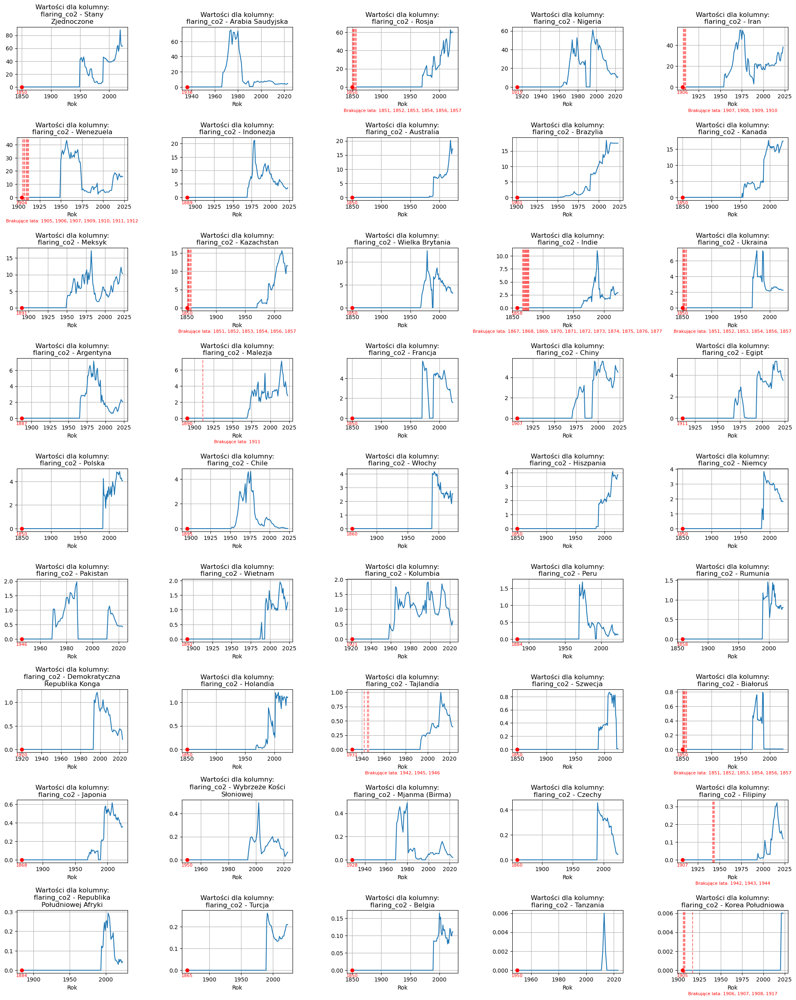

In [31]:
column_flaring = 'flaring_co2'
data_charts.chart_missing_values(processed5_df_fill, column_flaring)

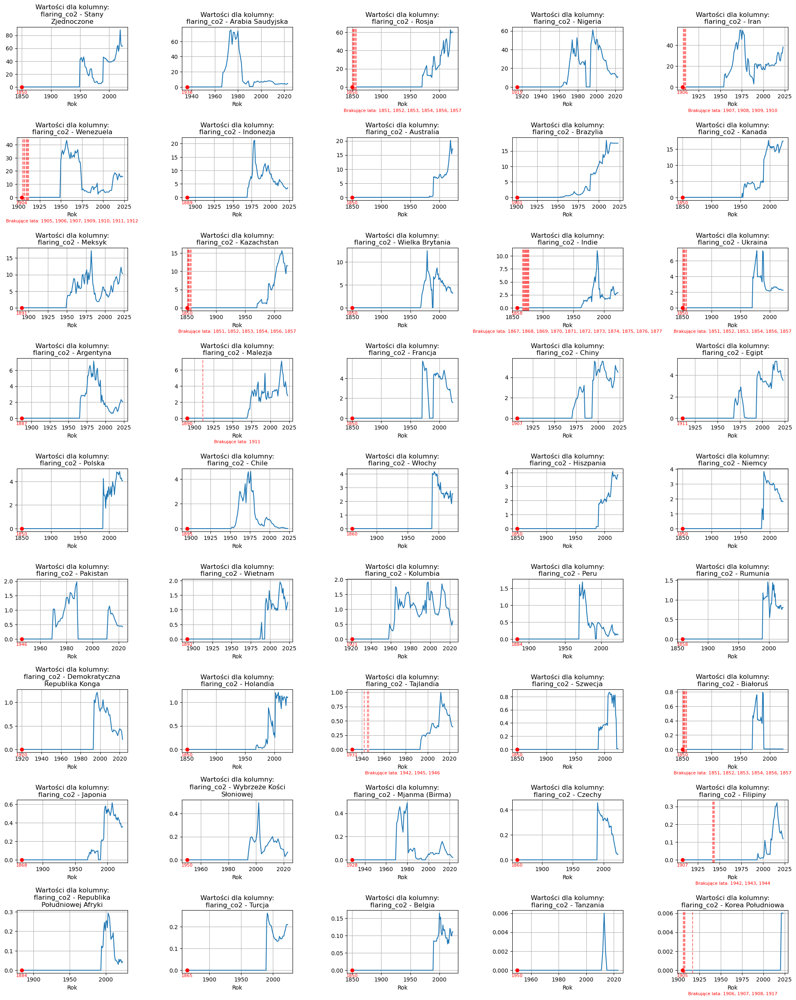

In [32]:
# Process data by removing missing values before the first non-null value
processed6_df_before = data_preprocess.apply_process_country_data(processed5_df_fill, column_flaring, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed6_df_before, column_flaring)

In [33]:
data_missing.missing_values(processed6_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            20.741562
primary_energy_consumption     60.545080
temperature_change_from_co2     0.237680
total_ghg                       0.000000
cement_co2                     26.445888
coal_co2                        0.000000
flaring_co2                     0.903185
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

In [34]:
# Check missing values for each country
data_missing.calculate_missing_values_percentage(processed6_df_before, entity_column, column_flaring)

,country,missing_percentage
0,Indie,6.626506
1,Wenezuela,5.833333
2,Białoruś,3.448276
3,Ukraina,3.448276
4,Kazachstan,3.448276
5,Rosja,3.448276
6,Iran,3.389831
7,Korea Południowa,3.361345
8,Tajlandia,3.225806
9,Filipiny,2.564103


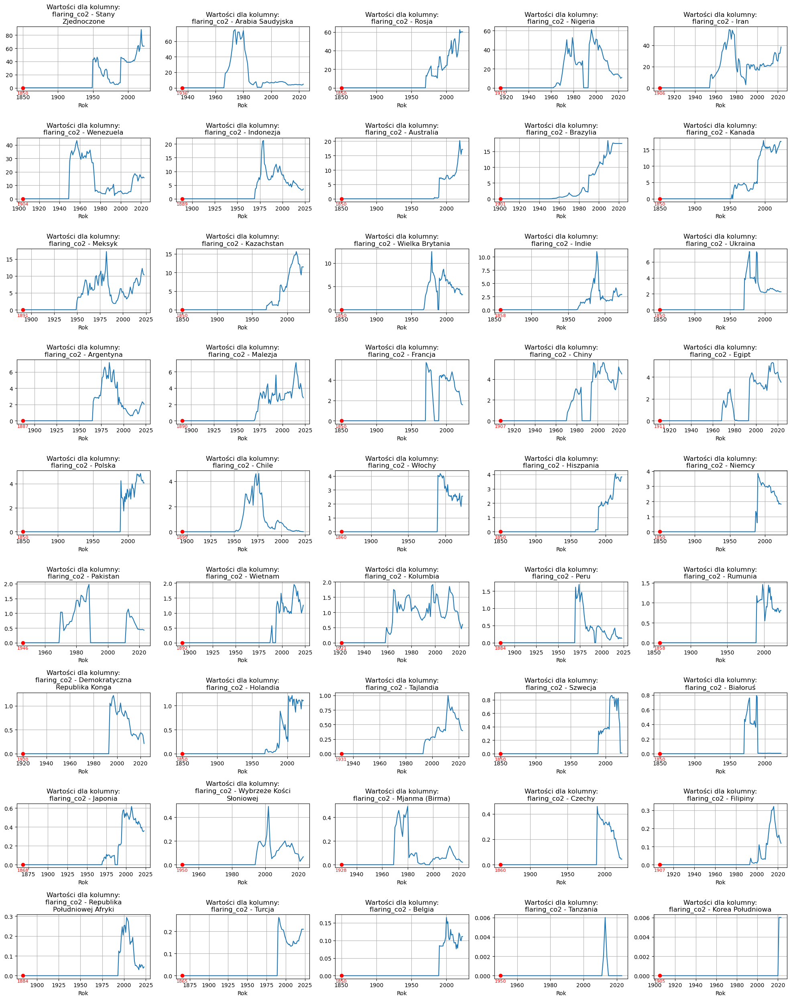

In [35]:
# Process data by filling missing values - max 7% are missing (because this is the same % for flaring_co2 I use fill to all of that columns)
processed6_df_fill = data_preprocess.apply_process_country_data(processed6_df_before, column_flaring, data_preprocess.process_country_data_fill)
data_charts.chart_missing_values(processed6_df_fill, column_flaring)

In [36]:
data_missing.missing_values(processed6_df_fill)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            20.741562
primary_energy_consumption     60.545080
temperature_change_from_co2     0.237680
total_ghg                       0.000000
cement_co2                     26.445888
coal_co2                        0.000000
flaring_co2                     0.000000
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

2g. Check 'temperature_change_from_co2' column

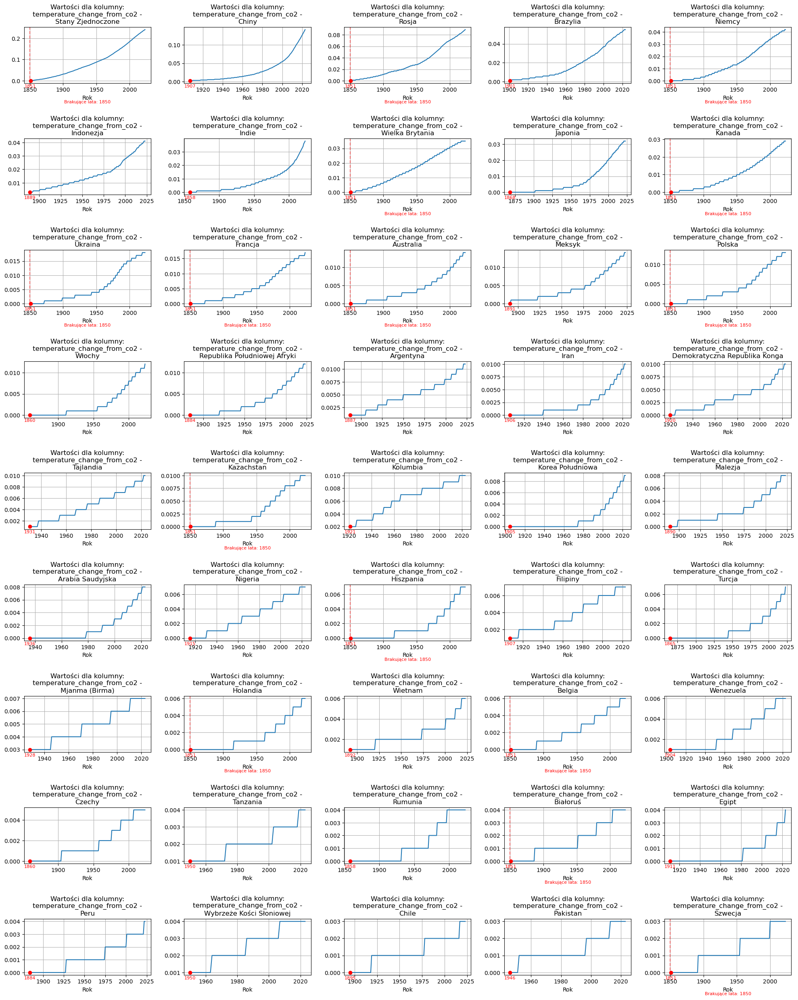

In [37]:
column_temp = 'temperature_change_from_co2'
data_charts.chart_missing_values(processed6_df_fill, column_temp)

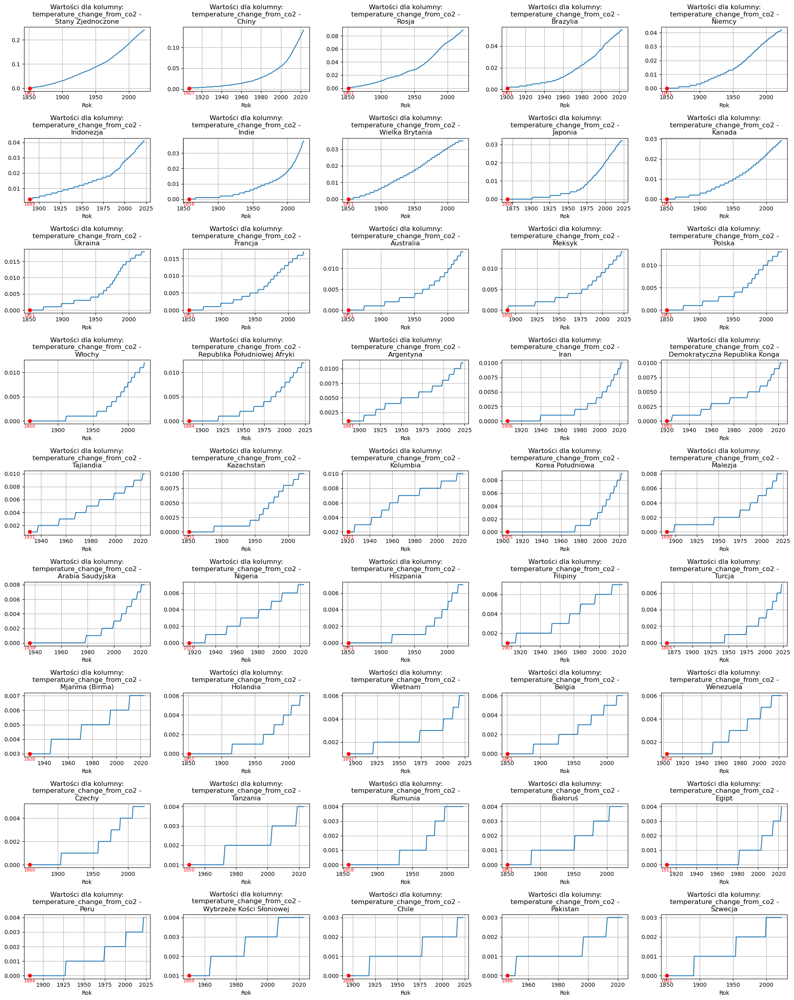

In [38]:
# Process data by removing missing values before the first non-null value
processed7_df_before = data_preprocess.apply_process_country_data(processed6_df_fill, column_temp, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed7_df_before, column_temp)

In [39]:
data_missing.missing_values(processed7_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            20.727446
primary_energy_consumption     60.451080
temperature_change_from_co2     0.000000
total_ghg                       0.000000
cement_co2                     26.302414
coal_co2                        0.000000
flaring_co2                     0.000000
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

2h. Check 'gdp' column

/Users/majarusak/Desktop/Areas/Praca_magisterska/co2_repo/src/data_preparation/data_cleaning.py:122: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


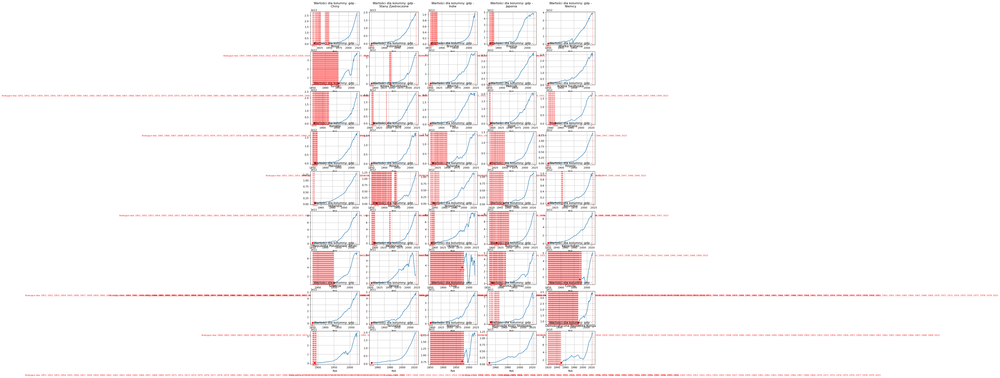

In [40]:
column_gdp = 'gdp'
data_charts.chart_missing_values(processed7_df_before, column_gdp)

/Users/majarusak/Desktop/Areas/Praca_magisterska/co2_repo/src/data_preparation/data_cleaning.py:122: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


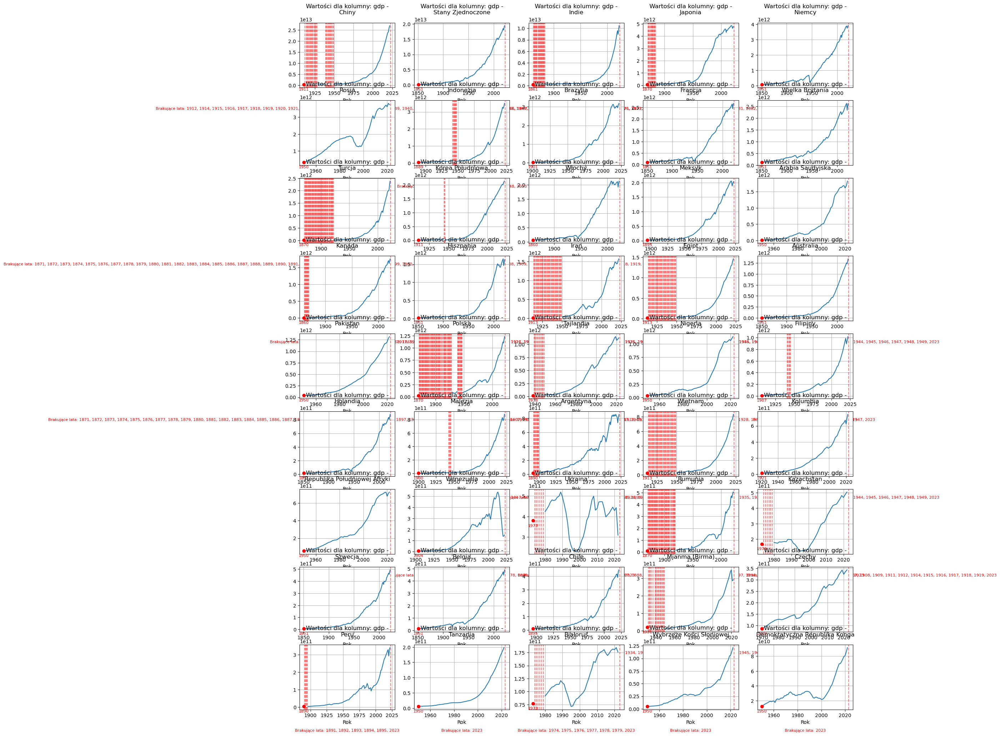

In [41]:
# Process data by removing missing values before the first non-null value
processed8_df_before = data_preprocess.apply_process_country_data(processed7_df_before, column_gdp, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed8_df_before, column_gdp)

In [42]:
data_missing.missing_values(processed8_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                             8.405212
primary_energy_consumption     54.395302
temperature_change_from_co2     0.000000
total_ghg                       0.000000
cement_co2                     22.334373
coal_co2                        0.000000
flaring_co2                     0.000000
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

In [43]:
# Check missing values for each country
missing_gdp = data_missing.calculate_missing_values_percentage(processed8_df_before, entity_column, column_gdp)
missing_gdp

,country,missing_percentage
0,Polska,40.909091
1,Turcja,33.766234
2,Iran,33.333333
3,Egipt,33.333333
4,Wietnam,33.333333
5,Rumunia,29.870130
6,Chiny,24.778761
7,Mjanma (Birma),18.279570
8,Tajlandia,13.953488
9,Ukraina,13.725490


In [44]:
missing_gdp[missing_gdp['missing_percentage'] > 7]['country'].unique()

array(['Polska', 'Turcja', 'Iran', 'Egipt', 'Wietnam', 'Rumunia', 'Chiny',
       'Mjanma (Birma)', 'Tajlandia', 'Ukraina', 'Białoruś', 'Kazachstan',
       'Indie', 'Japonia', 'Argentyna'], dtype=object)

In [45]:
#Process data

#Filter data on 2 datasets, where missing values > 7% and <= 7%
unique_countries_more_than_7_gdp = missing_gdp[missing_gdp['missing_percentage'] > 7]['country'].unique()
unique_countries_less_than_7_gdp = missing_gdp[missing_gdp['missing_percentage'] <= 7]['country'].unique()

processed6_df_more_than_7_gdp = processed8_df_before[processed8_df_before['country'].isin(unique_countries_more_than_7_gdp)]
processed6_df_less_than_7_gdp = processed8_df_before[processed8_df_before['country'].isin(unique_countries_less_than_7_gdp)]

#Missing values > 7% are removed
processed8_df_after = data_preprocess.apply_process_country_data(processed6_df_more_than_7_gdp, column_gdp, data_preprocess.process_country_data_after)

#Missing values <= 7% are filled
processed8_df_fill = data_preprocess.apply_process_country_data(processed6_df_less_than_7_gdp, column_gdp, data_preprocess.process_country_data_fill)

# Combine the two processed DataFrames into one
processed8_df = pd.concat([processed8_df_after, processed8_df_fill]).reset_index(drop=True)

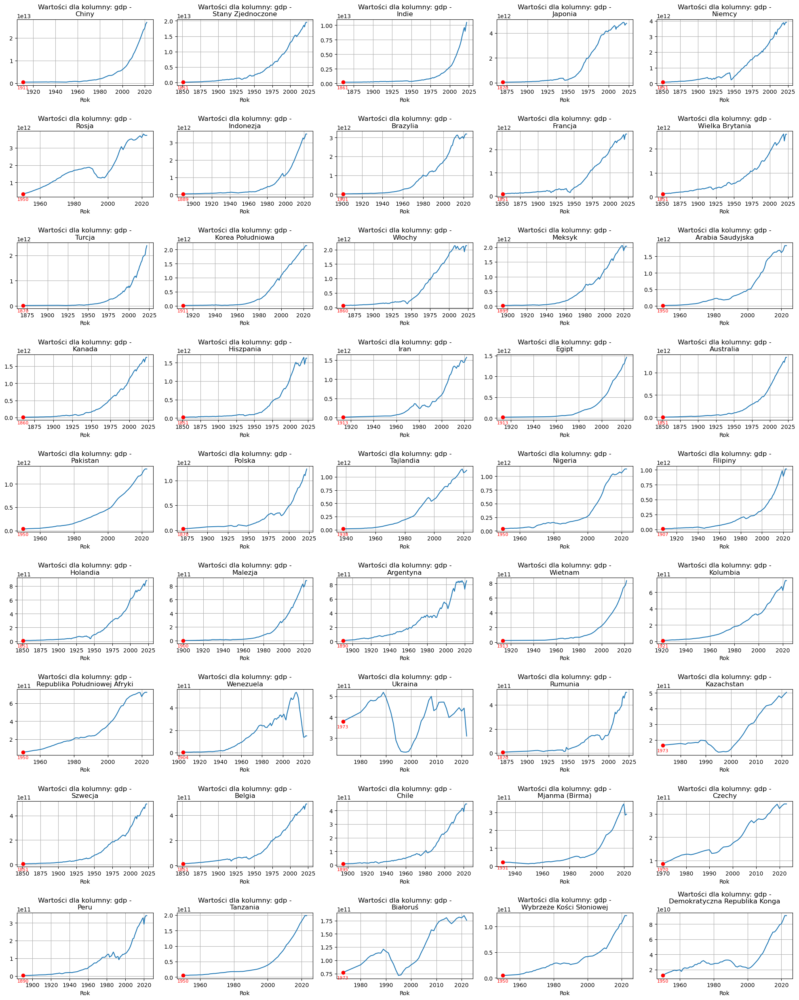

In [46]:
#Line chart
data_charts.chart_missing_values(processed8_df, column_gdp)

In [47]:
data_missing.missing_values(processed8_df)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                             0.000000
primary_energy_consumption     51.098357
temperature_change_from_co2     0.000000
total_ghg                       0.000000
cement_co2                     19.394419
coal_co2                        0.000000
flaring_co2                     0.000000
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

2i. Check 'cement_co2' column

/Users/majarusak/Desktop/Areas/Praca_magisterska/co2_repo/src/data_preparation/data_cleaning.py:122: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


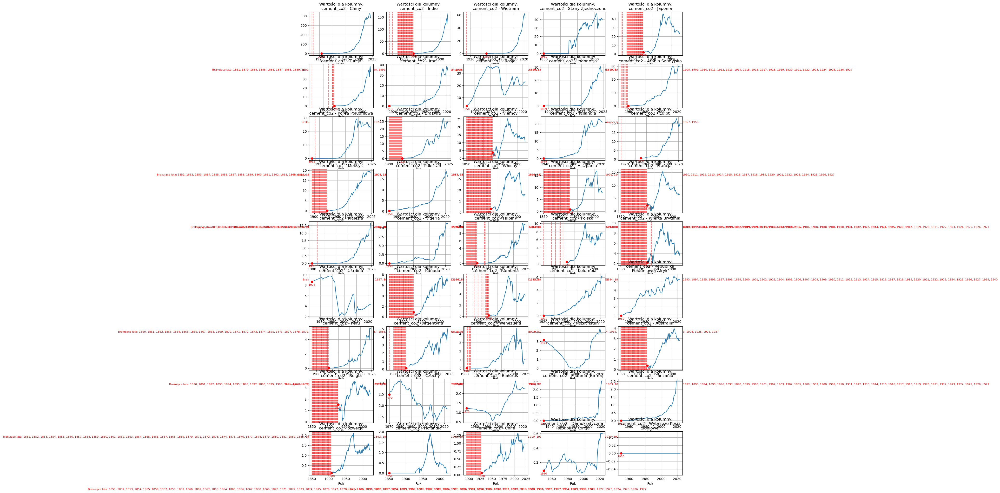

In [48]:
column_cement = 'cement_co2'
data_charts.chart_missing_values(processed8_df, column_cement)

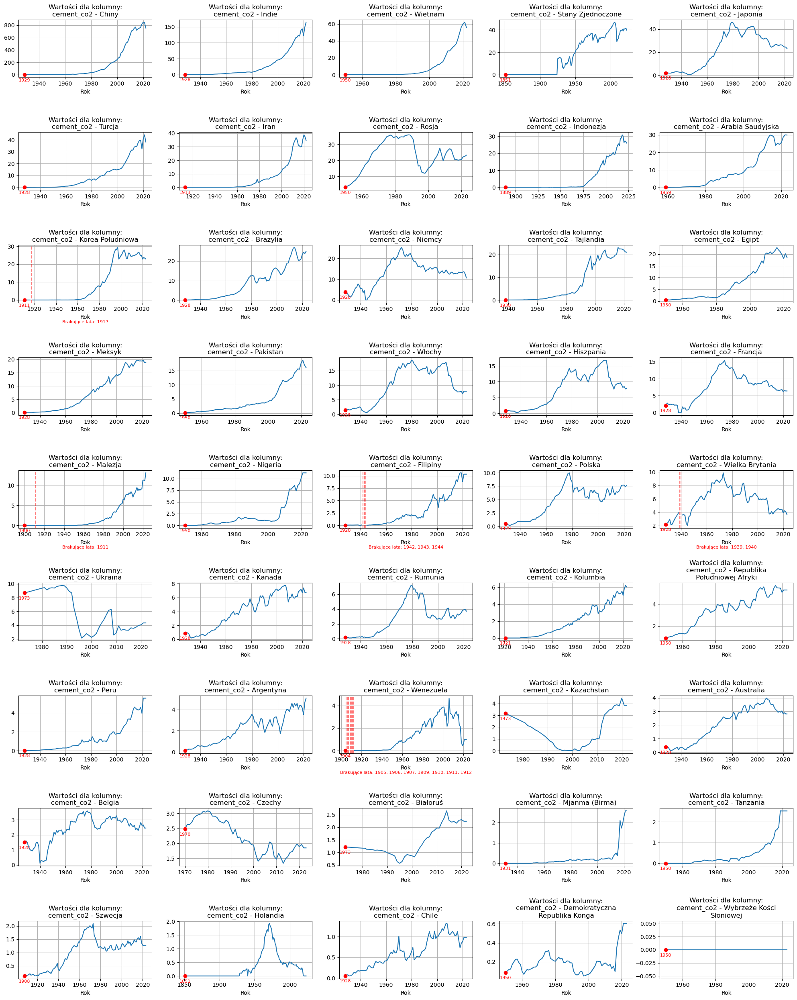

In [49]:
# Process data by removing missing values before the first non-null value
processed9_df_before = data_preprocess.apply_process_country_data(processed8_df, column_cement, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed9_df_before, column_cement)

In [50]:
data_missing.missing_values(processed9_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                             0.000000
primary_energy_consumption     39.540005
temperature_change_from_co2     0.000000
total_ghg                       0.000000
cement_co2                      0.342550
coal_co2                        0.000000
flaring_co2                     0.000000
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

In [51]:
# Check missing values for each country
missing_cement = data_missing.calculate_missing_values_percentage(processed9_df_before, entity_column, column_cement)
missing_cement

,country,missing_percentage
0,Wenezuela,5.833333
1,Filipiny,3.125000
2,Wielka Brytania,2.083333
3,Korea Południowa,0.884956
4,Malezja,0.806452
5,Wietnam,0.000000
6,Rosja,0.000000
7,Mjanma (Birma),0.000000
8,Niemcy,0.000000
9,Nigeria,0.000000


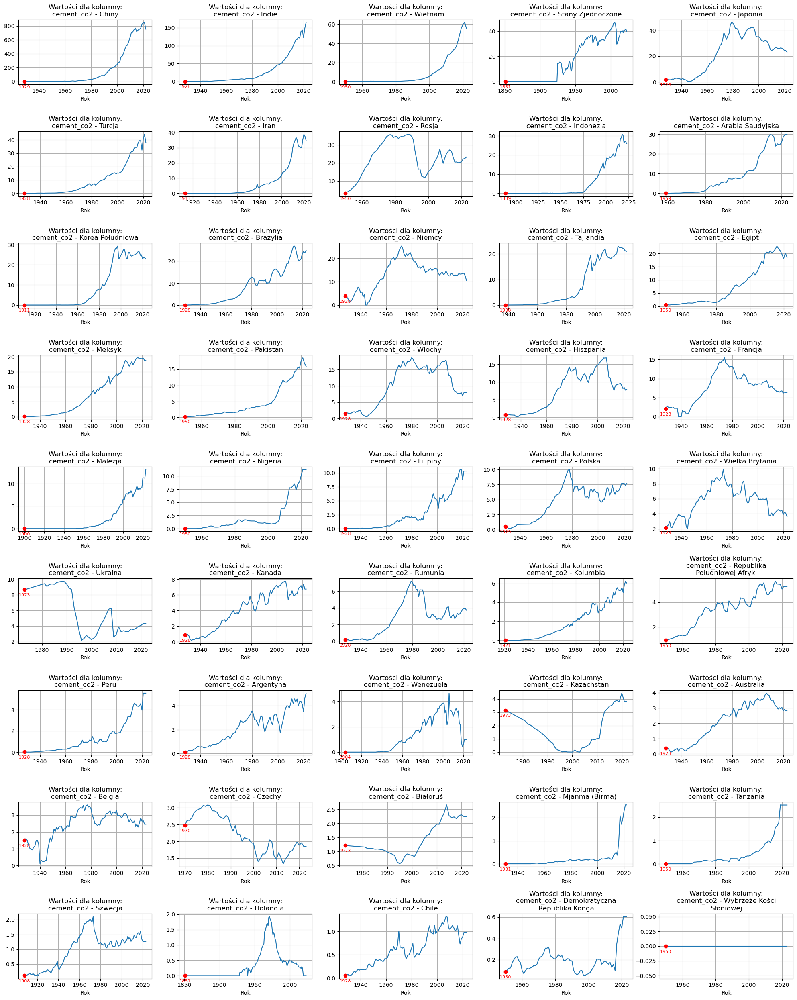

In [52]:
# Process data by filling missing values - max 7% missing
processed9_df_fill = data_preprocess.apply_process_country_data(processed9_df_before, column_cement, data_preprocess.process_country_data_fill)
data_charts.chart_missing_values(processed9_df_fill, column_cement)

In [53]:
data_missing.missing_values(processed9_df_fill)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                             0.000000
primary_energy_consumption     39.540005
temperature_change_from_co2     0.000000
total_ghg                       0.000000
cement_co2                      0.000000
coal_co2                        0.000000
flaring_co2                     0.000000
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

2f. Remove 'primary_energy_consumption' column

In [54]:
# Primary energy consumption and total ghg has still a lot of missing values so I assume to just remove them
processed9_df = processed9_df_fill.drop(columns={'primary_energy_consumption'})
processed9_df

,year,country,population,gdp,temperature_change_from_co2,total_ghg,cement_co2,coal_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,co2_including_luc
0,1929,Chiny,480666438.0,4.887348e+11,0.005,626.554,0.077,48.194,0.000,0.000,286.917,0.011,335.199
1,1930,Chiny,482831090.0,4.948680e+11,0.005,651.512,0.073,49.331,0.000,0.000,351.178,0.154,400.736
2,1931,Chiny,485235901.0,5.000296e+11,0.005,672.305,0.098,51.620,0.000,0.000,376.159,0.187,428.063
3,1932,Chiny,487883101.0,5.156630e+11,0.006,699.377,0.080,49.973,0.000,0.000,400.470,0.216,450.740
4,1933,Chiny,490774936.0,4.615000e+11,0.006,726.130,0.113,53.731,0.000,0.000,419.670,0.267,473.781
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4082,2019,Szwecja,10279122.0,4.670207e+11,0.003,72.984,1.357,8.115,0.536,1.780,5.166,28.523,45.999
4083,2020,Szwecja,10353680.0,4.568853e+11,0.003,69.069,1.272,6.649,0.445,1.442,5.528,26.363,42.231
4084,2021,Szwecja,10416136.0,4.814924e+11,0.003,72.092,1.259,6.992,0.009,1.901,6.410,27.953,45.044
4085,2022,Szwecja,10487333.0,4.942145e+11,0.003,69.975,1.259,6.914,0.012,1.550,6.823,25.997,44.298


In [55]:
data_missing.missing_values(processed9_df)

year                           0.0
country                        0.0
population                     0.0
gdp                            0.0
temperature_change_from_co2    0.0
total_ghg                      0.0
cement_co2                     0.0
coal_co2                       0.0
flaring_co2                    0.0
gas_co2                        0.0
land_use_change_co2            0.0
oil_co2                        0.0
co2_including_luc              0.0
dtype: float64

3. Final co2 emission

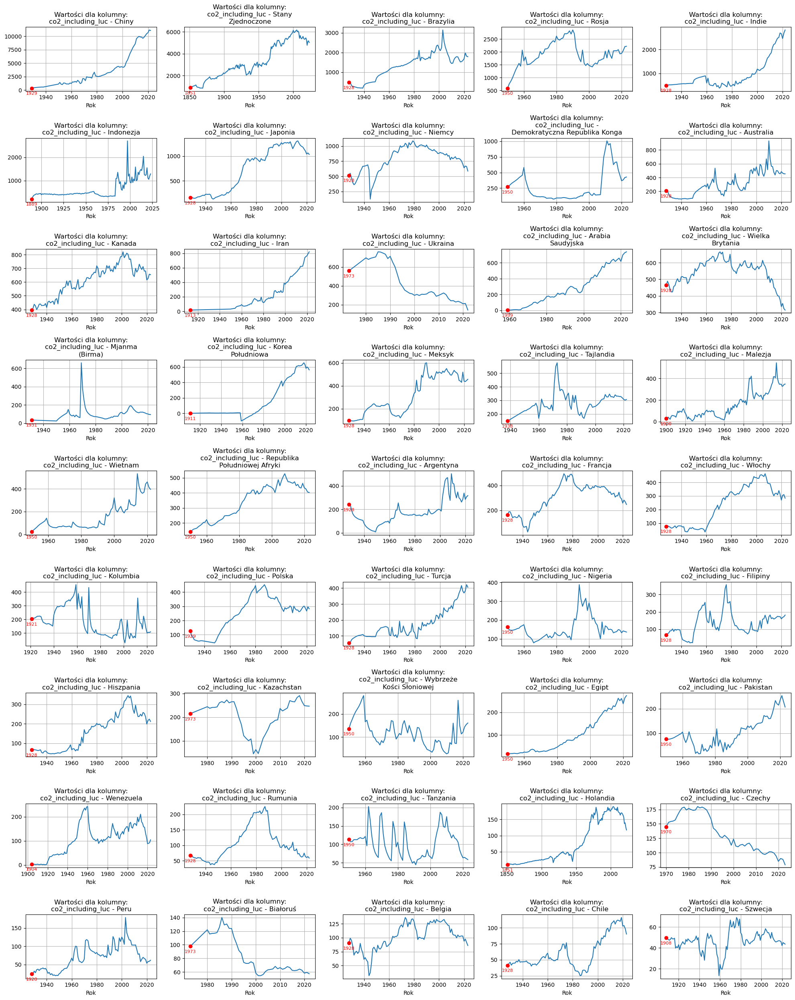

In [56]:
#Final co2 emission line charts
data_charts.chart_missing_values(processed9_df, column_co2)

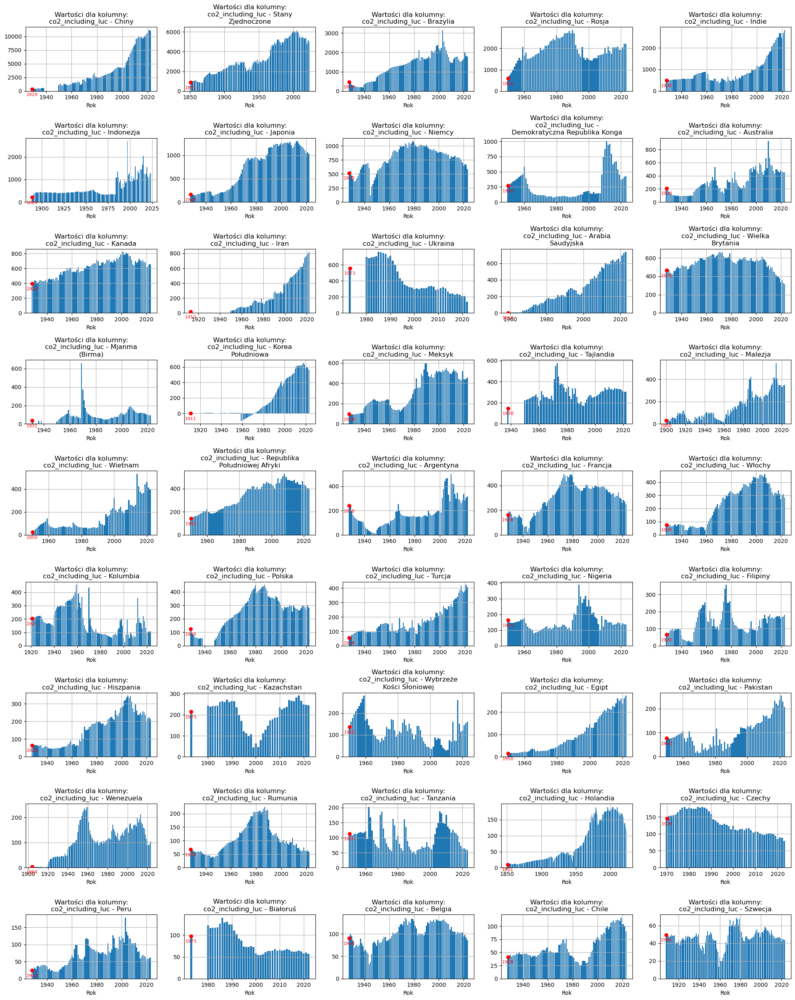

In [57]:
data_charts.chart_missing_values(processed9_df, column_co2, 'bar')

In [58]:
#when I removed all missing values - 3998 stayed
#when I filled missing values - 4164 stayed
#when I filled most missing values, ony gdp removed for some countries - 4027 stayed
processed9_df = processed9_df.sort_values(by=['country', 'year']).reset_index(drop=True)
processed9_df

,year,country,population,gdp,temperature_change_from_co2,total_ghg,cement_co2,coal_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,co2_including_luc
0,1959,Arabia Saudyjska,2348014.0,2.543139e+10,0.000,5.760,0.036,0.000,0.000,0.000,0.901,1.817,2.755
1,1960,Arabia Saudyjska,2435410.0,2.797009e+10,0.000,7.809,0.044,0.000,0.000,0.000,0.282,2.631,2.957
2,1961,Arabia Saudyjska,2526351.0,3.128838e+10,0.000,10.955,0.051,0.000,0.000,0.000,0.541,3.517,4.109
3,1962,Arabia Saudyjska,2620915.0,3.502136e+10,0.000,18.839,0.091,0.000,0.000,0.022,0.732,6.137,6.982
4,1963,Arabia Saudyjska,2719348.0,3.807041e+10,0.000,21.091,0.098,0.000,0.000,0.029,1.054,6.811,7.993
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4082,2019,Włochy,60130136.0,2.115726e+12,0.011,391.391,7.912,30.483,2.756,146.769,-28.090,148.587,311.544
4083,2020,Włochy,59912763.0,1.925752e+12,0.011,351.234,7.059,22.129,2.112,140.816,-32.748,127.651,269.854
4084,2021,Włochy,59729354.0,2.060300e+12,0.011,384.792,7.919,24.566,1.816,151.364,-31.520,147.039,304.457
4085,2022,Włochy,59619106.0,2.136009e+12,0.011,389.478,7.919,31.376,2.549,137.601,-30.497,157.949,310.175


In [59]:
# Function to check if the year column is continuous for each country
def check_non_continuous_years(df):
    non_continuous_countries = []
    for country in df['country'].unique():
        country_df = df[df['country'] == country].sort_values(by='year')
        years = country_df['year'].tolist()
        continuous = all(years[i] + 1 == years[i + 1] for i in range(len(years) - 1))
        if not continuous:
            non_continuous_countries.append(country)
    return non_continuous_countries

# Function to remove isolated years if data is not continuous
def remove_isolated_years(df):
    new_df = pd.DataFrame()
    for country in df['country'].unique():
        country_df = df[df['country'] == country].sort_values(by='year')
        years = country_df['year'].tolist()
        if not all(years[i] + 1 == years[i + 1] for i in range(len(years) - 1)):
            first_continuous_year = years[1]  # Assume the first non-continuous year is an outlier
            new_country_df = country_df[country_df['year'] >= first_continuous_year]
            new_df = pd.concat([new_df, new_country_df])
        else:
            new_df = pd.concat([new_df, country_df])
    return new_df

non_continuous_countries = check_non_continuous_years(processed9_df)
cleaned_df = processed9_df.copy()
iteration = 1
while non_continuous_countries:
    print(f"Iteration {iteration}: Non-continuous countries: {non_continuous_countries}")
    cleaned_df = remove_isolated_years(cleaned_df)
    non_continuous_countries = check_non_continuous_years(cleaned_df)
    iteration += 1

cleaned_df


Iteration 1: Non-continuous countries: ['Białoruś', 'Chiny', 'Iran', 'Kazachstan', 'Mjanma (Birma)', 'Polska', 'Tajlandia', 'Ukraina']
Iteration 2: Non-continuous countries: ['Chiny', 'Mjanma (Birma)', 'Polska']
Iteration 3: Non-continuous countries: ['Chiny', 'Mjanma (Birma)', 'Polska']
Iteration 4: Non-continuous countries: ['Chiny', 'Polska']
Iteration 5: Non-continuous countries: ['Chiny', 'Polska']
Iteration 6: Non-continuous countries: ['Chiny', 'Polska']
Iteration 7: Non-continuous countries: ['Chiny', 'Polska']
Iteration 8: Non-continuous countries: ['Chiny', 'Polska']
Iteration 9: Non-continuous countries: ['Chiny', 'Polska']
Iteration 10: Non-continuous countries: ['Chiny', 'Polska']


,year,country,population,gdp,temperature_change_from_co2,total_ghg,cement_co2,coal_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,co2_including_luc
0,1959,Arabia Saudyjska,2348014.0,2.543139e+10,0.000,5.760,0.036,0.000,0.000,0.000,0.901,1.817,2.755
1,1960,Arabia Saudyjska,2435410.0,2.797009e+10,0.000,7.809,0.044,0.000,0.000,0.000,0.282,2.631,2.957
2,1961,Arabia Saudyjska,2526351.0,3.128838e+10,0.000,10.955,0.051,0.000,0.000,0.000,0.541,3.517,4.109
3,1962,Arabia Saudyjska,2620915.0,3.502136e+10,0.000,18.839,0.091,0.000,0.000,0.022,0.732,6.137,6.982
4,1963,Arabia Saudyjska,2719348.0,3.807041e+10,0.000,21.091,0.098,0.000,0.000,0.029,1.054,6.811,7.993
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4082,2019,Włochy,60130136.0,2.115726e+12,0.011,391.391,7.912,30.483,2.756,146.769,-28.090,148.587,311.544
4083,2020,Włochy,59912763.0,1.925752e+12,0.011,351.234,7.059,22.129,2.112,140.816,-32.748,127.651,269.854
4084,2021,Włochy,59729354.0,2.060300e+12,0.011,384.792,7.919,24.566,1.816,151.364,-31.520,147.039,304.457
4085,2022,Włochy,59619106.0,2.136009e+12,0.011,389.478,7.919,31.376,2.549,137.601,-30.497,157.949,310.175


In [60]:
cleaned_df.isna().sum()

year                           0
country                        0
population                     0
gdp                            0
temperature_change_from_co2    0
total_ghg                      0
cement_co2                     0
coal_co2                       0
flaring_co2                    0
gas_co2                        0
land_use_change_co2            0
oil_co2                        0
co2_including_luc              0
dtype: int64

In [61]:
cleaned_df = cleaned_df.sort_values(by=['country', 'year']).reset_index(drop=True)
cleaned_df

,year,country,population,gdp,temperature_change_from_co2,total_ghg,cement_co2,coal_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,co2_including_luc
0,1959,Arabia Saudyjska,2348014.0,2.543139e+10,0.000,5.760,0.036,0.000,0.000,0.000,0.901,1.817,2.755
1,1960,Arabia Saudyjska,2435410.0,2.797009e+10,0.000,7.809,0.044,0.000,0.000,0.000,0.282,2.631,2.957
2,1961,Arabia Saudyjska,2526351.0,3.128838e+10,0.000,10.955,0.051,0.000,0.000,0.000,0.541,3.517,4.109
3,1962,Arabia Saudyjska,2620915.0,3.502136e+10,0.000,18.839,0.091,0.000,0.000,0.022,0.732,6.137,6.982
4,1963,Arabia Saudyjska,2719348.0,3.807041e+10,0.000,21.091,0.098,0.000,0.000,0.029,1.054,6.811,7.993
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4054,2019,Włochy,60130136.0,2.115726e+12,0.011,391.391,7.912,30.483,2.756,146.769,-28.090,148.587,311.544
4055,2020,Włochy,59912763.0,1.925752e+12,0.011,351.234,7.059,22.129,2.112,140.816,-32.748,127.651,269.854
4056,2021,Włochy,59729354.0,2.060300e+12,0.011,384.792,7.919,24.566,1.816,151.364,-31.520,147.039,304.457
4057,2022,Włochy,59619106.0,2.136009e+12,0.011,389.478,7.919,31.376,2.549,137.601,-30.497,157.949,310.175


In [62]:
cleaned_df = cleaned_df.rename(columns={"co2_including_luc": "co2"})

In [63]:
# Save in csv
cleaned_df.to_csv(os.path.join(config.output_cleaned, 'data_cleaned.csv'), index=False)